Found 400 images belonging to 2 classes.
400/400 [==============================] - 87s 214ms/step


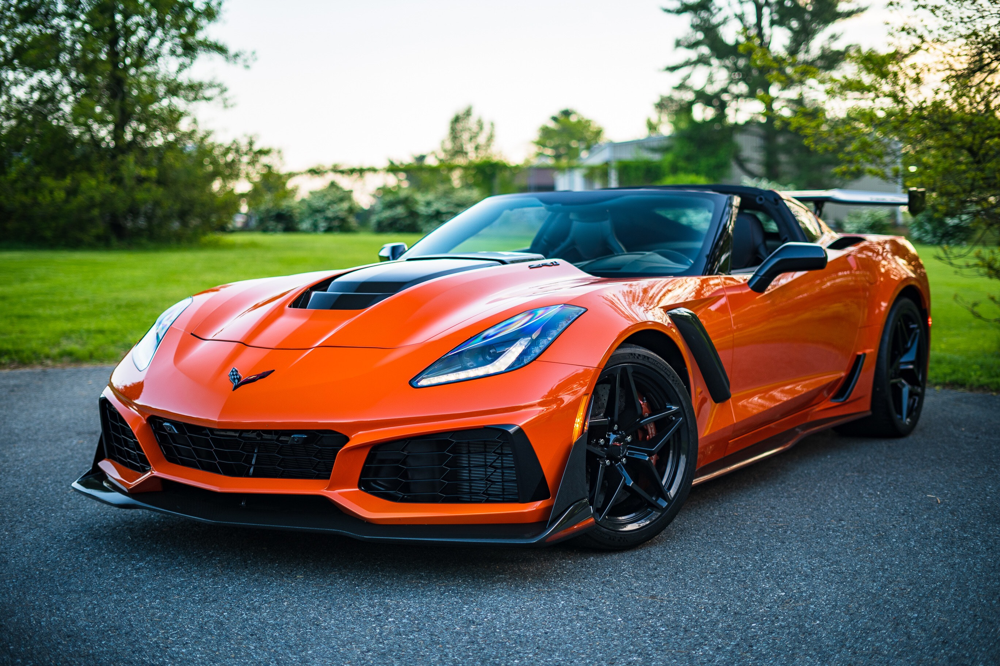

1/1 [==============================] - 0s 364ms/step
Similar Images:
Path: v_data/train/cars/9.jpg
Class Label: cars/9.jpg


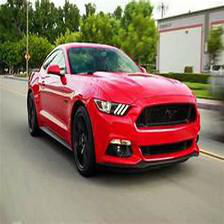


Path: v_data/train/cars/115.jpg
Class Label: cars/115.jpg


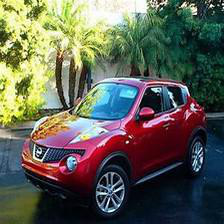


Path: v_data/train/cars/174.jpg
Class Label: cars/174.jpg


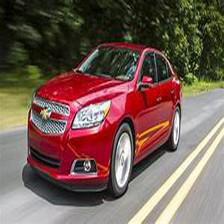


Path: v_data/train/cars/111.jpg
Class Label: cars/111.jpg


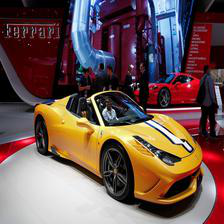


Path: v_data/train/cars/33.jpg
Class Label: cars/33.jpg


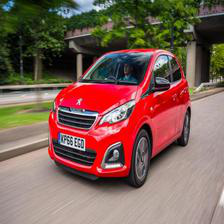

In [4]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from sklearn.neighbors import NearestNeighbors
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from IPython.display import display

# Set the path to your image folder
image_folder = "v_data/train"

# Load pre-trained ResNet model
resnet = ResNet50(weights='imagenet', include_top=False, pooling='avg')

# Define image transformation
def preprocess_image(image):
    img = img_to_array(image)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    return img

# Load and preprocess images from the folder
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_image)
image_data = image_generator.flow_from_directory(
    image_folder,
    target_size=(224, 224),
    batch_size=1,
    shuffle=False,
    class_mode=None
)

image_paths = image_data.filepaths
class_labels = image_data.filenames

# Extract features using ResNet
embeddings = resnet.predict(image_data, verbose=1)

# Train KNN classifier
k = 5  # Number of nearest neighbors
knn = NearestNeighbors(n_neighbors=k)
knn.fit(embeddings)

# Test similarity search
test_image_path = "sports_car.jpg"
test_img = load_img(test_image_path)
display(test_img)

# Preprocess the test image
test_image = load_img(test_image_path, target_size=(224, 224))
test_img = preprocess_image(test_image)

# Extract feature embedding for the test image
test_embedding = resnet.predict(test_img).flatten()

# Find k-nearest neighbors
distances, indices = knn.kneighbors([test_embedding])

# Retrieve similar image paths and class labels
similar_image_paths = [image_paths[idx] for idx in indices.flatten()]
similar_class_labels = [class_labels[idx] for idx in indices.flatten()]

# Display the similar images
print("Similar Images:")
for i in range(len(similar_image_paths)):
    print("Path:", similar_image_paths[i])
    print("Class Label:", similar_class_labels[i])
    similar_image = load_img(similar_image_paths[i])
    display(similar_image)
    print()
